<a href="https://colab.research.google.com/github/ClaraJ-se/DiagnoSmart_Platform/blob/main/notebooks/run_cellpose_GPU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Running cellpose in colab with a GPU

(thanks to Matteo Carandini for setting this up)

UPDATED DEC 2020 for TORCH VERSION cellpose v0.6

UPDATED NOV 2021 for cellpose / omnipose v0.7

## installation

Install cellpose -- by default the torch GPU version is installed in COLAB notebook.

Note that cellpose uses the latest version of numpy, so please click the "Restart runtime" button once the install completes.

In [1]:
!pip install "opencv-python-headless<4.3"
!pip install cellpose

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 MB 14.3 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 1.3.1 requires opencv-python-headless>=4.1.1, but you have opencv-python-headless 3.4.18.65 which is incompatible.
qudida 0.0.4 requires opencv-python-headless>=4.0.1, but you have opencv-python-headless 3.4.18.65 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 204.4/204.4 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.6/39.6 MB 10.6 MB/s eta 0:00:00
  Using cached nvidia_cud

Check CUDA version and GPU

In [2]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
Sat May  4 06:07:44 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   58C    P8              10W /  7

import libraries and check GPU (the first time you import cellpose the models will download).

In [3]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
from cellpose import models, core

use_GPU = core.use_gpu()
print('>>> GPU activated? %d'%use_GPU)

# call logger_setup to have output of cellpose written
from cellpose.io import logger_setup
logger_setup();


>>> GPU activated? 1


Download sample images

In [15]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Number of images loaded: 5.


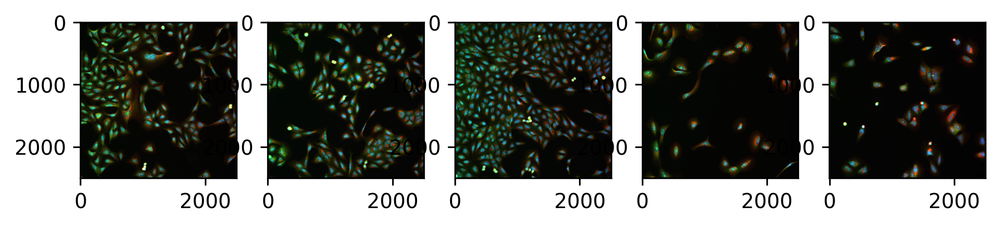

In [39]:
import os, shutil
# @title Default title text
from cellpose import utils

# # REPLACE FILES WITH YOUR IMAGE PATHS
Input_Directory = "/content/drive/MyDrive/SegMine/data/subset_rgb"
input_dir = os.path.join(Input_Directory, "")
image_format = "tiff"
save_dir = input_dir+"Masks/"
if not os.path.exists(save_dir):
  os.makedirs(save_dir)
else:
  print("Existing Mask Directory found. Deleting it.")
  shutil.rmtree(save_dir)

files=[]

for r, d, f in os.walk(input_dir):
    for fil in f:
      if (image_format):
        if fil.endswith(image_format):
          files.append(os.path.join(r, fil))
      else:
        files.append(os.path.join(r, fil))
    break #only read the root directory; can change this to include levels
if(len(files)==0):
  print("Number of images loaded: %d." %(len(files)))
  print("Cannot read image files. Check if folder has images")
else:
  print("Number of images loaded: %d." %(len(files)))

# files = ['img0.tif', 'img1.tif']

imgs = [skimage.io.imread(f) for f in files]
nimg = len(imgs)

plt.figure(figsize=(8,4))
for k,img in enumerate(imgs):
  plt.subplot(1,5,k+1)
  plt.imshow(img)


## run cellpose on 2D sample images

(exclude last download, it's a 3D tiff)

In [38]:
# RUN CELLPOSE

imgs_2D = imgs

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto3' or model_type='nuclei'
model_choice = 'cyto3'
model = models.Cellpose(gpu=use_GPU, model_type=model_choice)

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus
channels = [2,1]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended)
# diameter can be a list or a single number for all images
diameter = 0 # the diameter of U2OS cells ranges between 16 ± 2 μm in width, 23 ± 3 μm in length but there is a wide diveristy in the dataset which we want to capture so let the algorithm estimate
cellprob_threshold = -1
flow_threshold = 0.4
masks, flows, styles, diams = model.eval(imgs_2D, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)

100%|██████████| 25.3M/25.3M [00:00<00:00, 26.9MB/s]
100%|██████████| 3.54k/3.54k [00:00<00:00, 8.53MB/s]


KeyboardInterrupt: 

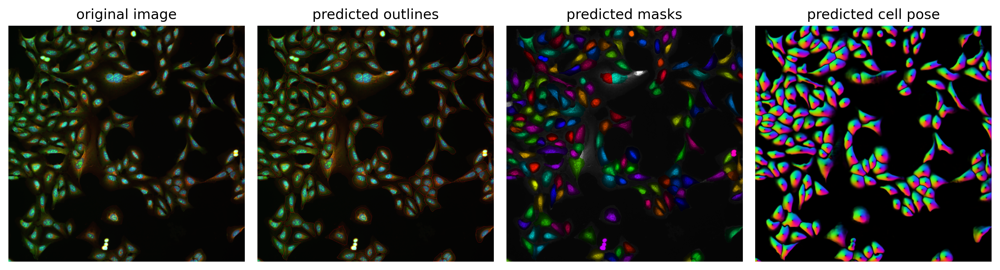

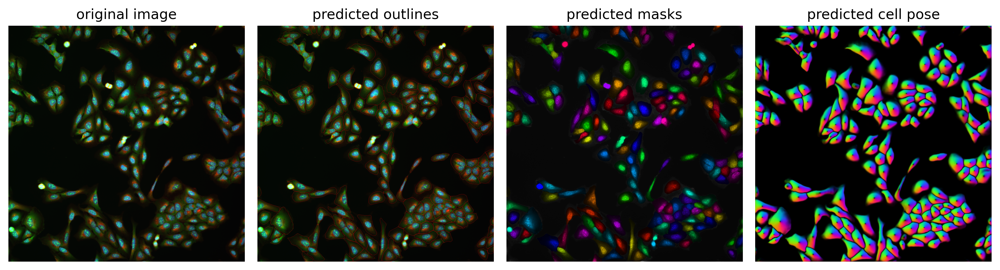

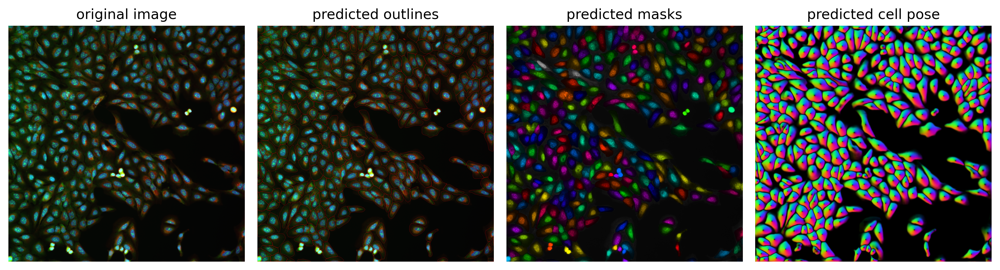

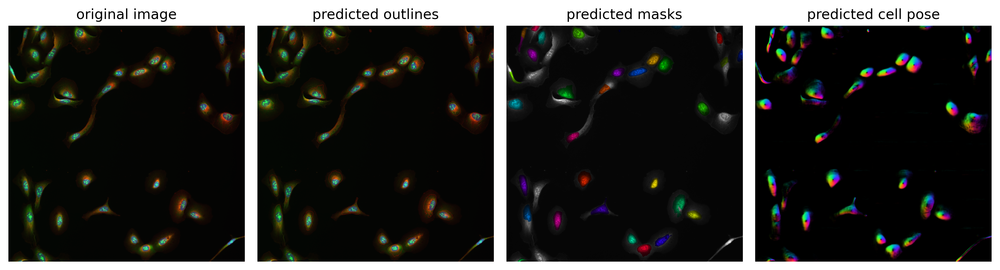

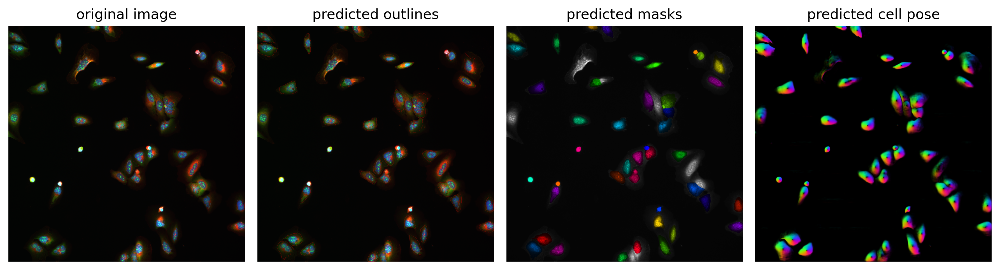

In [7]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs_2D)
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs[idx], maski, flowi)
    plt.tight_layout()
    plt.show()

## save output to *_seg.npy

you will see the files save in the Files tab and you can download them from there

In [10]:
from cellpose import io
print(files)
for file in files:
  io.masks_flows_to_seg(imgs, masks, flows, file, diams=diams, channels=channels)

#io.masks_flows_to_seg(imgs_2D, masks, flows, files, channels=channels, diams=diams)
print(os.path.exists('/content/drive/MyDrive/SegMine/data/images/subset_rgb/Masks/'))

['/content/drive/MyDrive/SegMine/data/subset_rgb/B02_s1_x0_y0_Fluorescence__rgb.tiff', '/content/drive/MyDrive/SegMine/data/subset_rgb/D14_s1_x0_y0_Fluorescence__rgb.tiff', '/content/drive/MyDrive/SegMine/data/subset_rgb/L10_s1_x0_y0_Fluorescence__rgb.tiff', '/content/drive/MyDrive/SegMine/data/subset_rgb/E03_s1_x0_y0_Fluorescence__rgb.tiff', '/content/drive/MyDrive/SegMine/data/subset_rgb/I04_s1_x0_y0_Fluorescence__rgb.tiff']
False


In [11]:
for img_idx, img in enumerate(imgs):
    file_name=os.path.splitext(os.path.basename(files[img_idx]))[0]
    print("\nSegmenting: ",file_name)
    mask, flow, style, diam = model.eval(img, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)
    #save images in folder with the diameter value used in cellpose
    print("Segmentation complete . Saving Masks and flows")
    #Output name for masks
    mask_output_name=save_dir+"MASK_"+file_name+".tiff"
    #Save mask as 16-bit in case this has to be used for detecting than 255 objects
    mask=mask.astype(np.uint16)
    #Save flow as 8-bit
    skimage.io.imsave(mask_output_name,mask, check_contrast=False)
#Save parameters used in Cellpose
parameters_file=save_dir+"Cellpose_parameters_used.txt"
outFile=open(parameters_file, "w")
outFile.write("CELLPOSE PARAMETERS\n")
outFile.write("Model: "+model_choice+"\n")
if diameter == 0:
  diameter = "Automatically estimated by cellpose"
outFile.write("Diameter: "+str(diameter)+"\n")
outFile.write("Flow Threshold: "+str(flow_threshold)+"\n")
outFile.write("Cell probability Threshold: "+str(cellprob_threshold)+"\n")
outFile.close()
print("\nSegmentation complete and files saved")


Segmenting:  B02_s1_x0_y0_Fluorescence__rgb
Segmentation complete . Saving Masks and flows

Segmenting:  D14_s1_x0_y0_Fluorescence__rgb
Segmentation complete . Saving Masks and flows

Segmenting:  L10_s1_x0_y0_Fluorescence__rgb
Segmentation complete . Saving Masks and flows

Segmenting:  E03_s1_x0_y0_Fluorescence__rgb
Segmentation complete . Saving Masks and flows

Segmenting:  I04_s1_x0_y0_Fluorescence__rgb
Segmentation complete . Saving Masks and flows

Segmentation complete and files saved


In [12]:
for file in files:
  io.masks_flows_to_seg(imgs, masks, flows, file, diams=diams, channels=channels)

/content/drive/MyDrive/SegMine/data/images_rgb/
Number of images loaded: 616.
images loaded in reality 166 /content/drive/MyDrive/SegMine/data/images_rgb/L07_s1_x0_y0_Fluorescence_rgb.tiff /content/drive/MyDrive/SegMine/data/images_rgb/O23_s2_x1_y0_Fluorescence_rgb.tiff


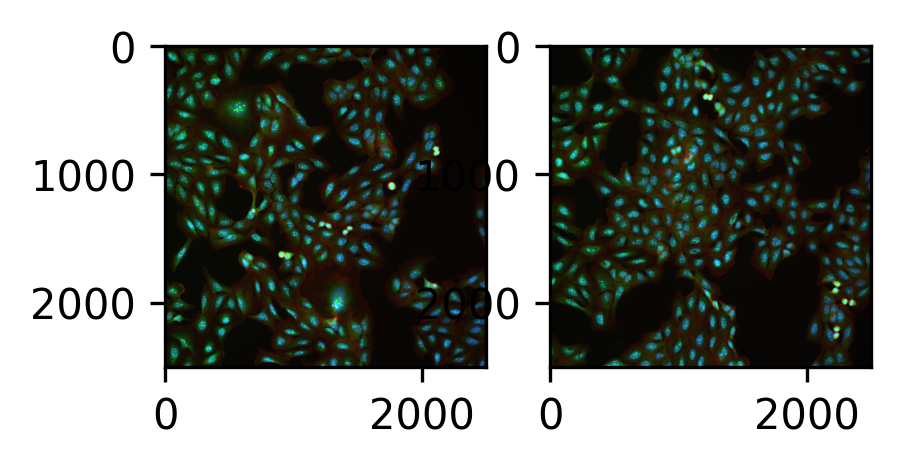

In [36]:
###APPLY ON WHOLE DATASET
####### SAVE PREVIOUS MASKS BEFORE RUNNING !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

# # REPLACE FILES WITH YOUR IMAGE PATHS
Input_Directory = "/content/drive/MyDrive/SegMine/data/images_rgb"
input_dir = os.path.join(Input_Directory, "")
print(input_dir)
image_format = "tiff"
save_dir = input_dir+"Masks/"
if not os.path.exists(save_dir):
  os.makedirs(save_dir)
else:
  print("Existing Mask Directory found. Deleting it.")
  shutil.rmtree(save_dir)

files=[]

for r, d, f in os.walk(input_dir):
    for fil in f:
      if (image_format):
        if fil.endswith(image_format):
          files.append(os.path.join(r, fil))
      else:
        files.append(os.path.join(r, fil))
    break #only read the root directory; can change this to include levels
if(len(files)==0):
  print("Number of images loaded: %d." %(len(files)))
  print("Cannot read image files. Check if folder has images")
else:
  print("Number of images loaded: %d." %(len(files)))

# files = ['img0.tif', 'img1.tif']
files = files[450:]
print("images loaded in reality", len(files), files[0], files[-1])
imgs = [skimage.io.imread(f) for f in files]
nimg = len(imgs)

plt.figure(figsize=(8,4))
for k,img in enumerate(imgs[:2]):
  plt.subplot(1,5,k+1)
  plt.imshow(img)

SystemError: CPUDispatcher(<function steps2D at 0x7e4ca3d68ee0>) returned a result with an exception set

/content/drive/MyDrive/SegMine/data/images_rgb/Masks/


In [37]:
model_choice = 'cyto3'
channels = [2,1]
diameter = 0
model = models.Cellpose(gpu=use_GPU, model_type=model_choice)
for img_idx, img in enumerate(imgs):
    file_name=os.path.splitext(os.path.basename(files[img_idx]))[0]
    print("\nSegmenting: ",img_idx, file_name)
    mask, flow, style, diam = model.eval(img, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)
    #save images in folder with the diameter value used in cellpose
    print("Segmentation complete . Saving Masks and flows")
    #Output name for masks
    mask_output_name=save_dir+"MASK_"+file_name+".tiff"
    #Save mask as 16-bit in case this has to be used for detecting than 255 objects
    mask=mask.astype(np.uint16)
    #Save flow as 8-bit
    skimage.io.imsave(mask_output_name,mask, check_contrast=False)
#Save parameters used in Cellpose
parameters_file=save_dir+"Cellpose_parameters_used.txt"
outFile=open(parameters_file, "w")
outFile.write("CELLPOSE PARAMETERS\n")
outFile.write("Model: "+model_choice+"\n")
if diameter == 0:
  diameter = "Automatically estimated by cellpose"
outFile.write("Diameter: "+str(diameter)+"\n")
outFile.write("Flow Threshold: "+str(flow_threshold)+"\n")
outFile.write("Cell probability Threshold: "+str(cellprob_threshold)+"\n")
outFile.close()
print("\nSegmentation complete and files saved")


Segmenting:  0 L07_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  1 L07_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  2 L08_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  3 L08_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  4 L09_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  5 L09_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  6 L10_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  7 L10_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  8 L11_s1_x0_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  9 L11_s2_x1_y0_Fluorescence_rgb
Segmentation complete . Saving Masks and flows

Segmenting:  10 L12_s1_x0_y0_Fluorescence_rgb
Segmentation complete .

## run cellpose 3D

There are two ways to run cellpose in 3D, this cell shows both, choose which one works best for you.

First way: computes flows from 2D slices and combines into 3D flows to create masks



running cellpose 2D slice flows => masks


KeyboardInterrupt: 

Second way: computes masks in 2D slices and stitches masks in 3D based on mask overlap

Note stitching (with stitch_threshold > 0) can also be used to track cells over time.

In [ ]:
# 2. computes masks in 2D slices and stitches masks in 3D based on mask overlap
print('running cellpose 2D + stitching masks')
masks_stitched, flows_stitched, styles_stitched, _ = model.eval(img_3D, channels=[2,1], diameter=25, do_3D=False, stitch_threshold=0.5)

running cellpose 2D + stitching masks
2024-02-22 21:47:35,226 [INFO] channels set to [2, 1]
2024-02-22 21:47:35,229 [INFO] ~~~ FINDING MASKS ~~~
2024-02-22 21:47:35,232 [INFO] multi-stack tiff read in as having 75 planes 2 channels
2024-02-22 21:47:36,009 [INFO] 100%|##########| 75/75 [00:00<00:00, 99.87it/s]
2024-02-22 21:47:36,013 [INFO] network run in 0.78s
2024-02-22 21:47:38,801 [INFO] 100%|##########| 75/75 [00:02<00:00, 26.95it/s]
2024-02-22 21:47:38,805 [INFO] stitching 75 planes using stitch_threshold=0.500 to make 3D masks


100%|██████████| 74/74 [00:00<00:00, 94.92it/s]

2024-02-22 21:47:39,607 [INFO] masks created in 3.59s
2024-02-22 21:47:39,626 [INFO] >>>> TOTAL TIME 4.40 sec


Results from 3D flows => masks computation

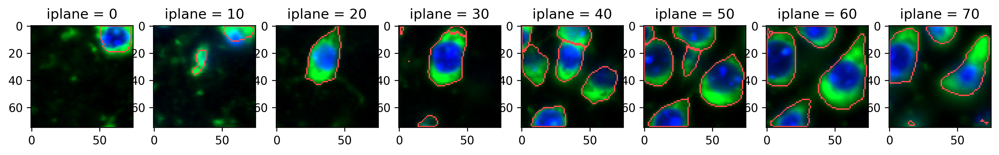

In [ ]:
# DISPLAY RESULTS 3D flows => masks
plt.figure(figsize=(15,3))
for i,iplane in enumerate(np.arange(0,75,10,int)):
  img0 = plot.image_to_rgb(img_3D[iplane, [1,0]].copy(), channels=[2,3])
  plt.subplot(1,8,i+1)
  outlines = utils.masks_to_outlines(masks[iplane])
  outX, outY = np.nonzero(outlines)
  imgout= img0.copy()
  imgout[outX, outY] = np.array([255,75,75])
  plt.imshow(imgout)
  plt.title('iplane = %d'%iplane)

Results from stitching

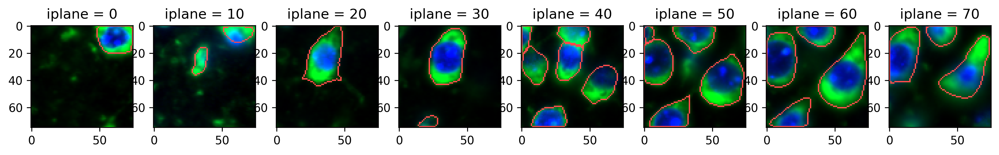

In [ ]:
# DISPLAY RESULTS stitching
plt.figure(figsize=(15,3))
for i,iplane in enumerate(np.arange(0,75,10,int)):
  img0 = plot.image_to_rgb(img_3D[iplane, [1,0]].copy(), channels=[2,3])
  plt.subplot(1,8,i+1)
  outlines = utils.masks_to_outlines(masks_stitched[iplane])
  outX, outY = np.nonzero(outlines)
  imgout= img0.copy()
  imgout[outX, outY] = np.array([255,75,75])
  plt.imshow(imgout)
  plt.title('iplane = %d'%iplane)

## connect to your google drive

so that you can run your own files (alternatively, upload them directly to the Files tab)